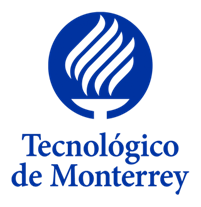

## Visión Computacional para imágenes y video (Gpo 10)
### Alumnos: 
* Armando Bringas Corpus - A01200230
* Guillermo Alfonso Muñiz Hermosillo - A01793101
* Jorge Luis Arroyo Chavelas - A01793023
* Samantha R Mancias Carrillo - A01196762
* Sofia E Mancias Carrillo - A01196563


### Profesores: 
* Dr. Gilberto Ochoa Ruiz
* Mtra. Yetnalezi Quintas Ruiz

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
2. [ORB Matching](#orb)
3. [SIFT Matching](#sift)
4. [Excercises with ORB and SIFT](#excercises)

    a. [Example 1](#sample1)
    
    b. [Example 2](#sample2)
    
    c. [Example 3](#sample3)
    
5. [Conclusion](#conclusion)
6. [References](#references)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [4]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

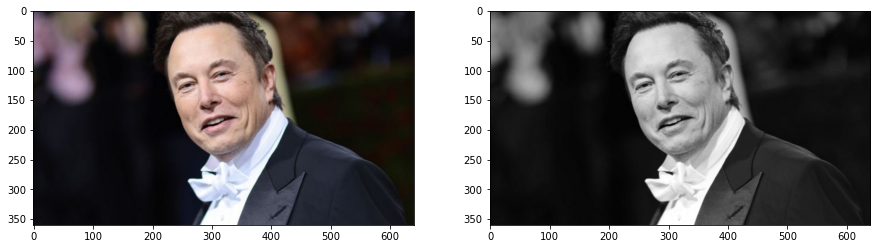

In [2]:
#reading image
img = cv2.imread('data/elon_1.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [3]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

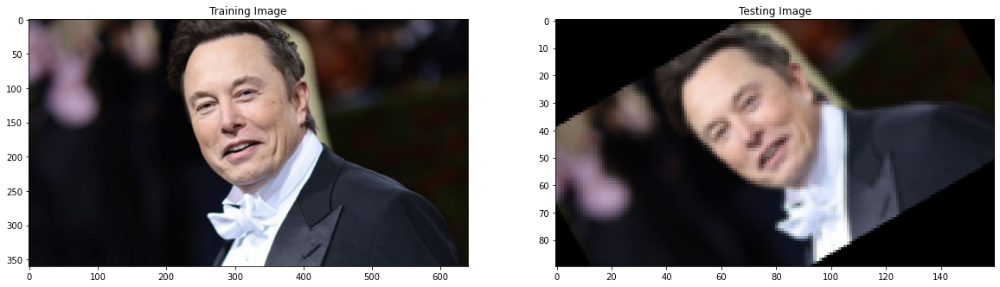

In [4]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [5]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  43


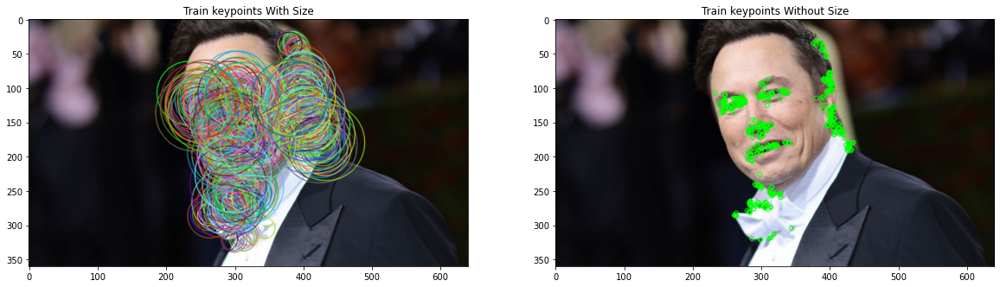

In [6]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

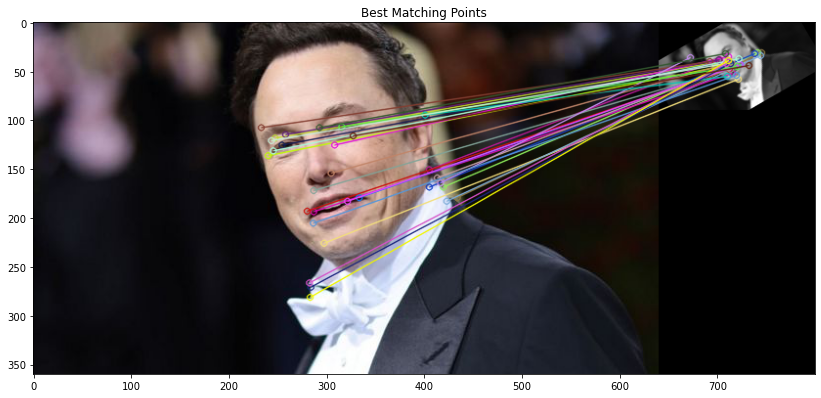


Number of Matching Keypoints Between The Training and Query Images:  30


In [7]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

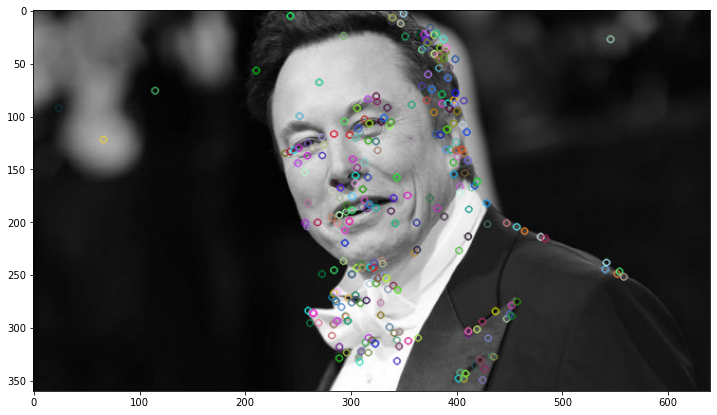

In [8]:
img1 = cv2.imread('data/elon_1.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

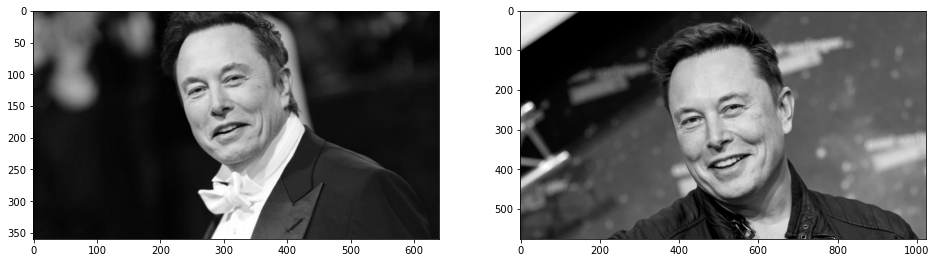

In [9]:
# read images
img1 = cv2.imread('data/elon_1.jpg')  
img2 = cv2.imread('data/elon_2.png') 

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [10]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(289, 734)

### Feature Matching

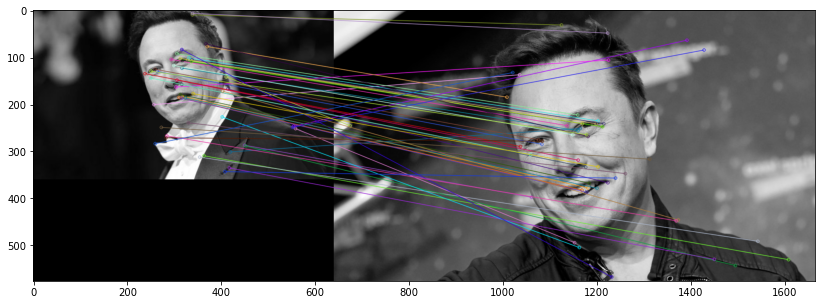

(<matplotlib.image.AxesImage at 0x1f39d3f7550>, None)

In [11]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

## Excersises <a class="anchor" id="excercises" ></a>

In [65]:
# Function to plot images
def plot_images(img_1, img_2, title_1, tittle_2):
    plt.figure(figsize=([20, 20]))
    plt.subplot(121),plt.imshow(img_1)
    plt.title(title_1), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img_2)
    plt.title(tittle_2), plt.xticks([]), plt.yticks([])
    
def plot_result(img_1):
    plt.figure(figsize=([20, 20]))
    plt.axis('off')
    plt.imshow(img_1)

In [56]:
def ORB(img_color, test_gray):
    orb = cv2.ORB_create()
    train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
    test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

    keypoints_without_size = np.copy(img_color)
    keypoints_with_size = np.copy(img_color)

    cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))
    cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display image with and without keypoints size
    plot_images(keypoints_with_size, keypoints_without_size, "Train keypoints With Size", "Train keypoints Without Size")
    
    
    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))
    
    # Create a Brute Force Matcher object.
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Perform the matching between the ORB descriptors of the training image and the test image
    matches = bf.match(train_descriptor, test_descriptor)

    # The matches with shorter distance are the ones we want.
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)
    
    return result, matches

In [57]:
def SIFT(img1, img2):
    sift = cv2.SIFT_create()
    keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
    
    keypoints_without_size = np.copy(img1)
    keypoints_with_size = np.copy(img1)

    cv2.drawKeypoints(img1, keypoints_1, keypoints_without_size, color = (0, 255, 0))
    cv2.drawKeypoints(img1, keypoints_1, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # Display image with and without keypoints size
    plot_images(keypoints_with_size, keypoints_without_size, "Train keypoints With Size", "Train keypoints Without Size")
    
    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(keypoints_1))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(keypoints_2))

    
    #feature matching
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1,descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)

    img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
    
    return img3, matches

### Example 1 <a class="anchor" id="sample1" ></a>

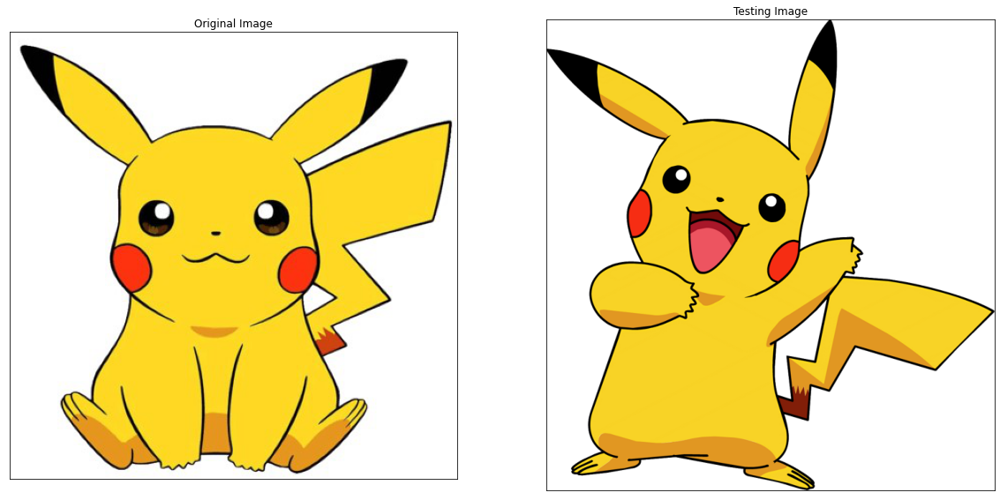

In [58]:
#reading image
img = cv2.imread('data/pikachu.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_image = cv2.imread('data/pikachu_2.png')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

plot_images(img_color, test_image, "Original Image", "Testing Image")

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500


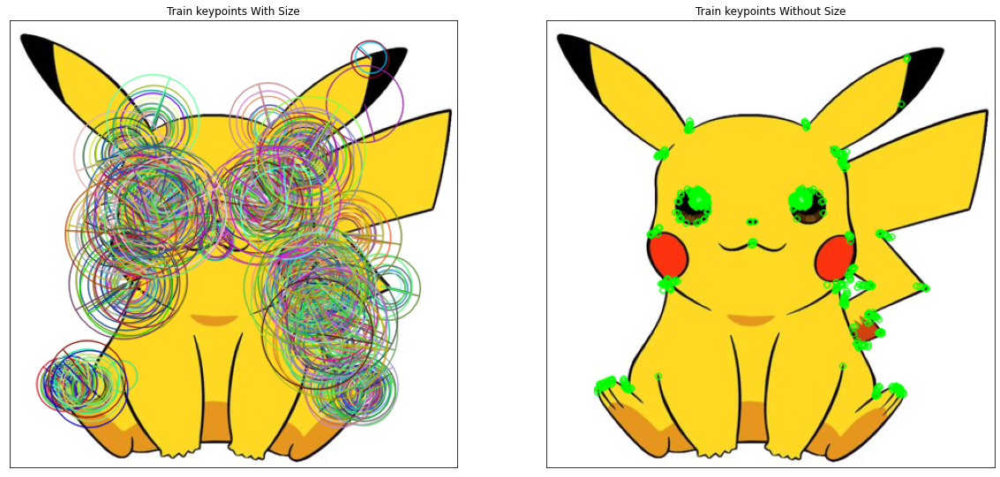

In [59]:
result, matches = ORB(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  77


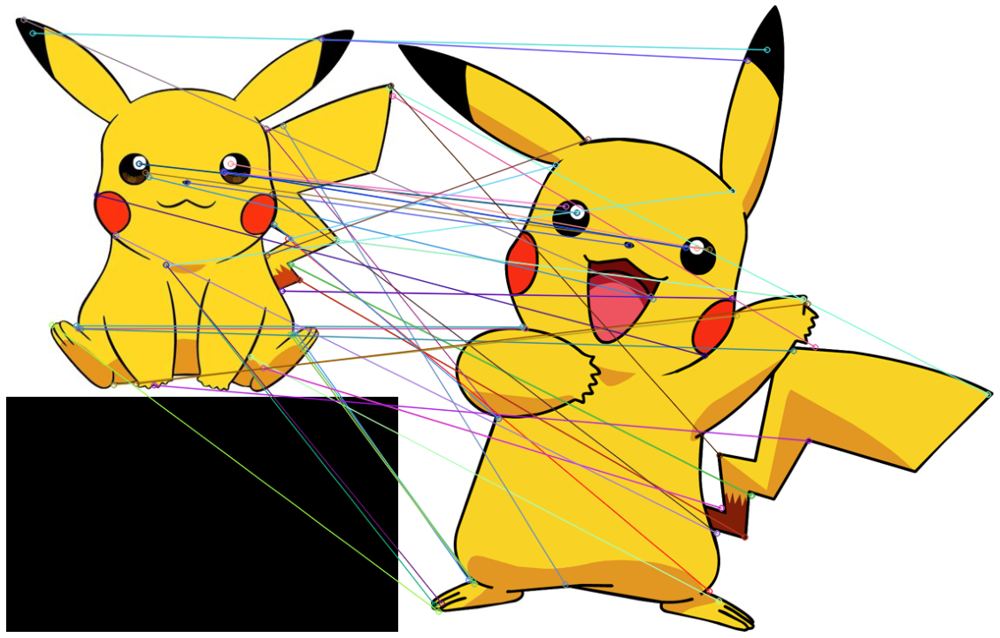

In [66]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Number of Keypoints Detected In The Training Image:  152
Number of Keypoints Detected In The Query Image:  314


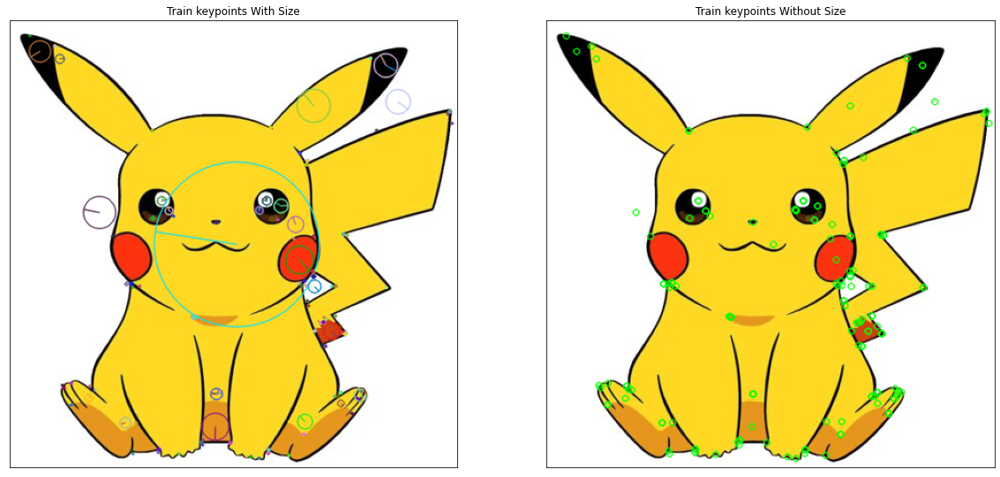

In [63]:
result, matches = SIFT(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  77


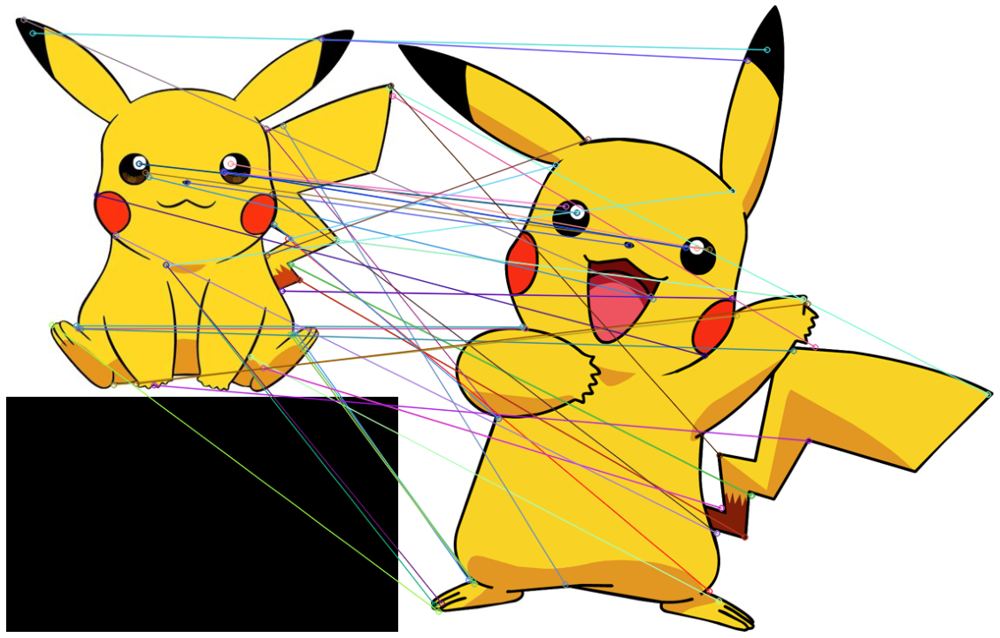

In [67]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

### Example 2 <a class="anchor" id="sample2" ></a>

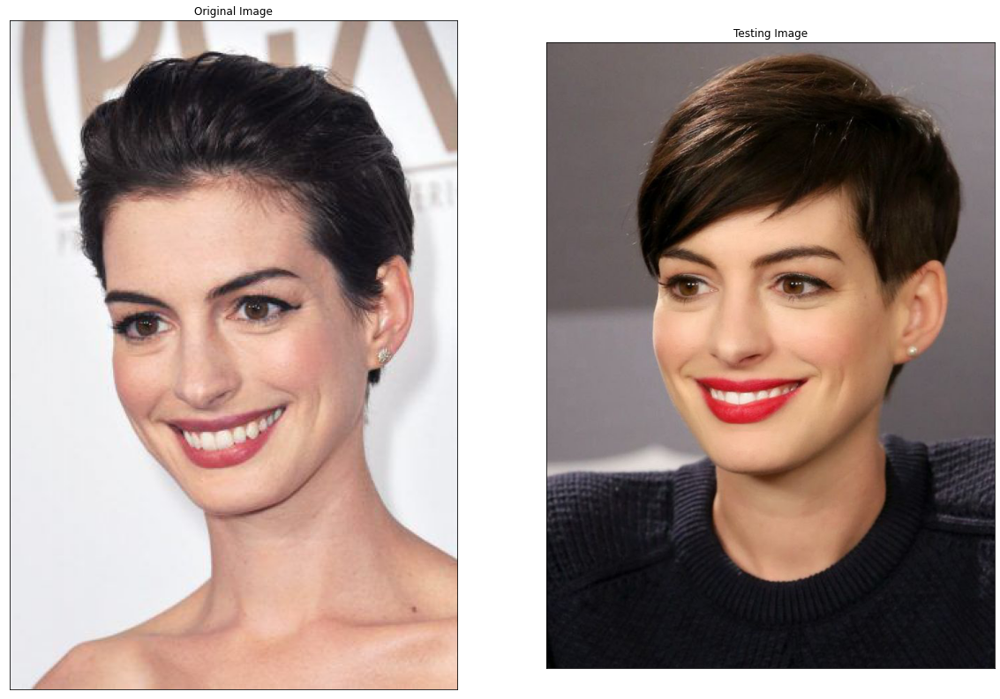

In [69]:
#reading image
img = cv2.imread('data/Anne.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_image = cv2.imread('data/Anne_2.jpg')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

plot_images(img_color, test_image, "Original Image", "Testing Image")

Number of Keypoints Detected In The Training Image:  498
Number of Keypoints Detected In The Query Image:  500


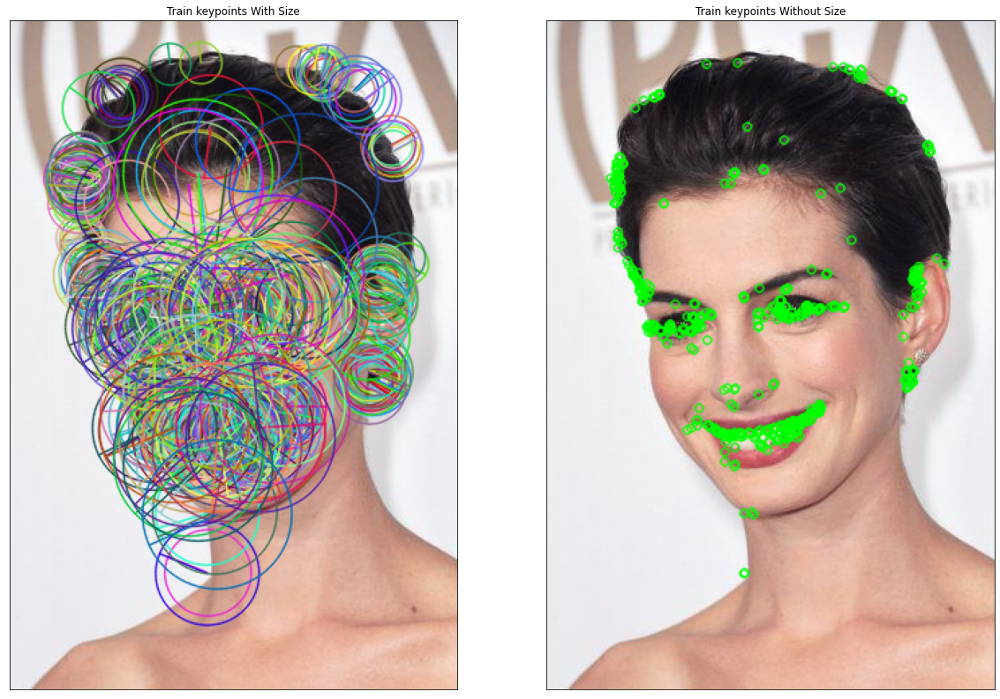

In [70]:
result, matches = ORB(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  130


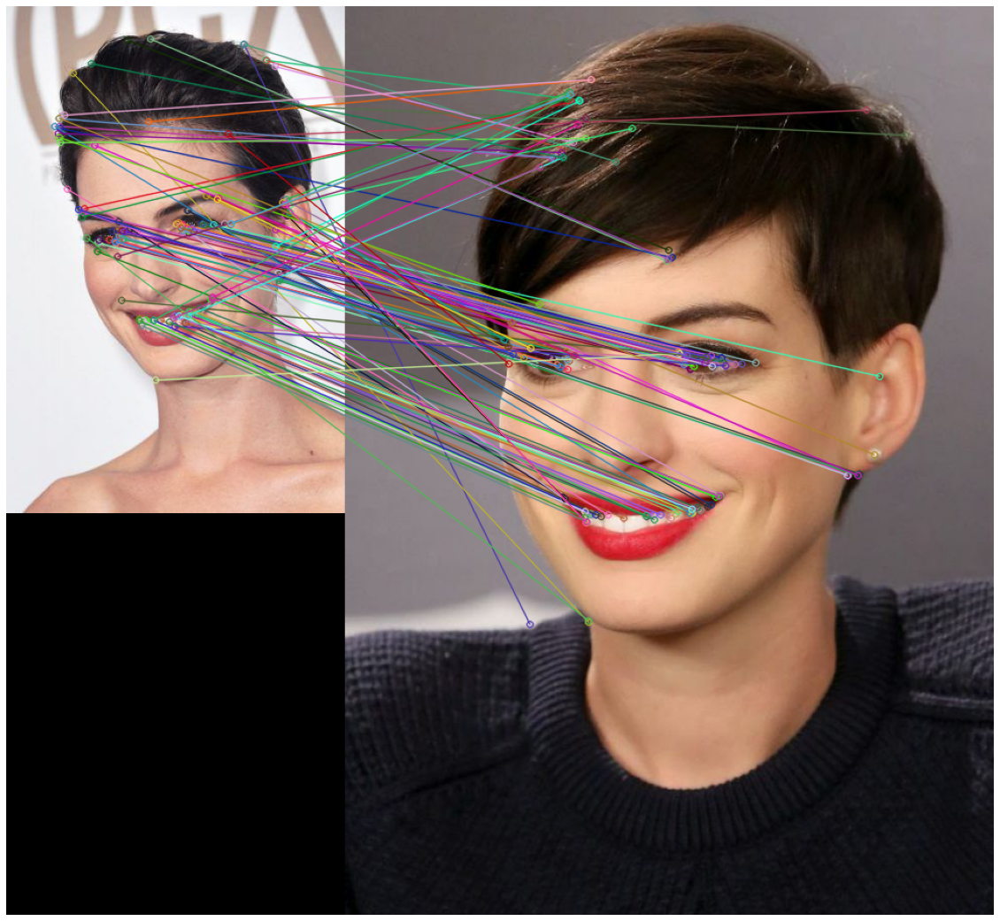

In [71]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Number of Keypoints Detected In The Training Image:  333
Number of Keypoints Detected In The Query Image:  621


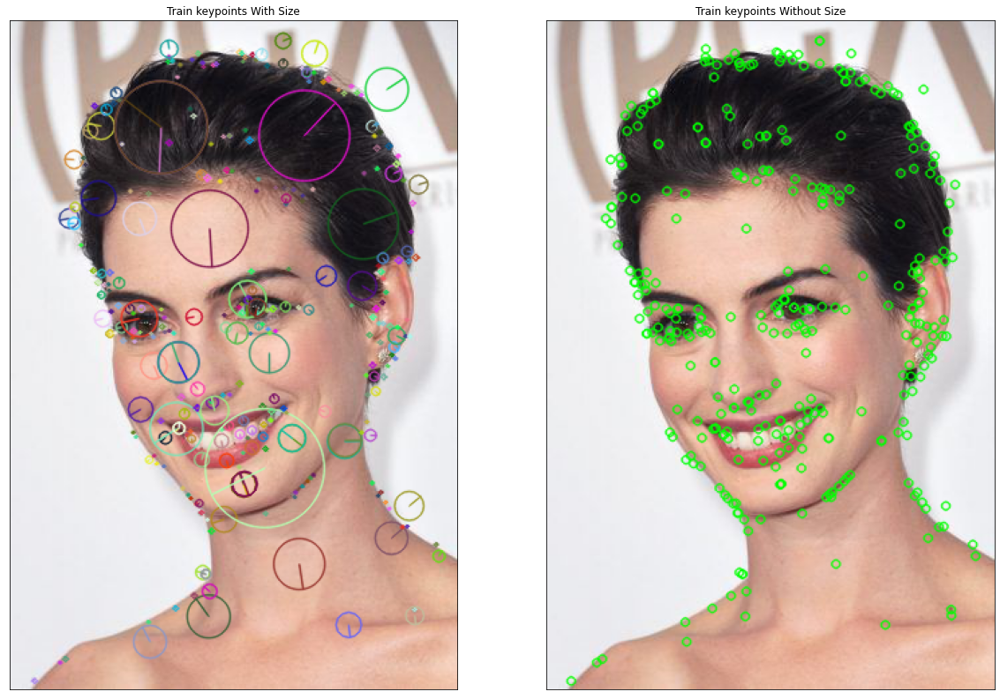

In [72]:
result, matches = SIFT(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  97


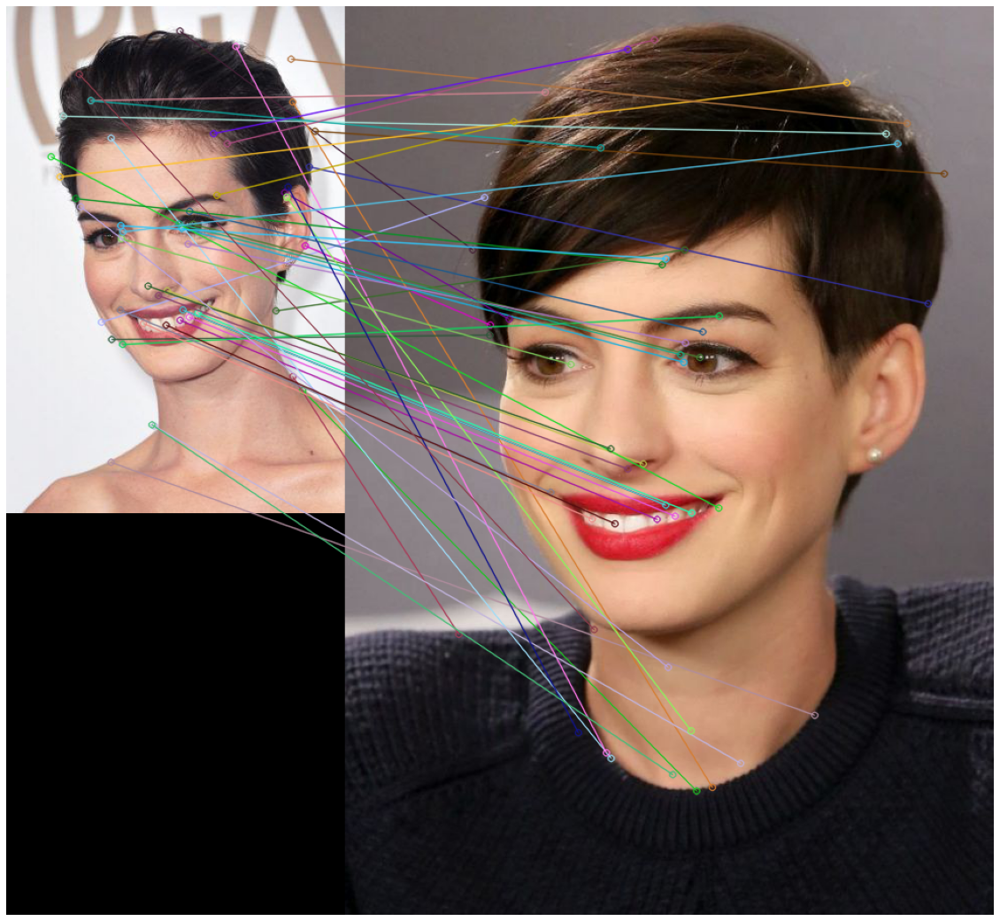

In [73]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## Conclusion <a class="anchor" id="conclusion" ></a>

## References <a class="anchor" id="references" ></a>

[1] Gonzalez, R. C., & Woods, R. E. (2018). Digital image processing (Fourth edition.). Pearson.